In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_B1-2.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 19325 × 97
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 920 × 97
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

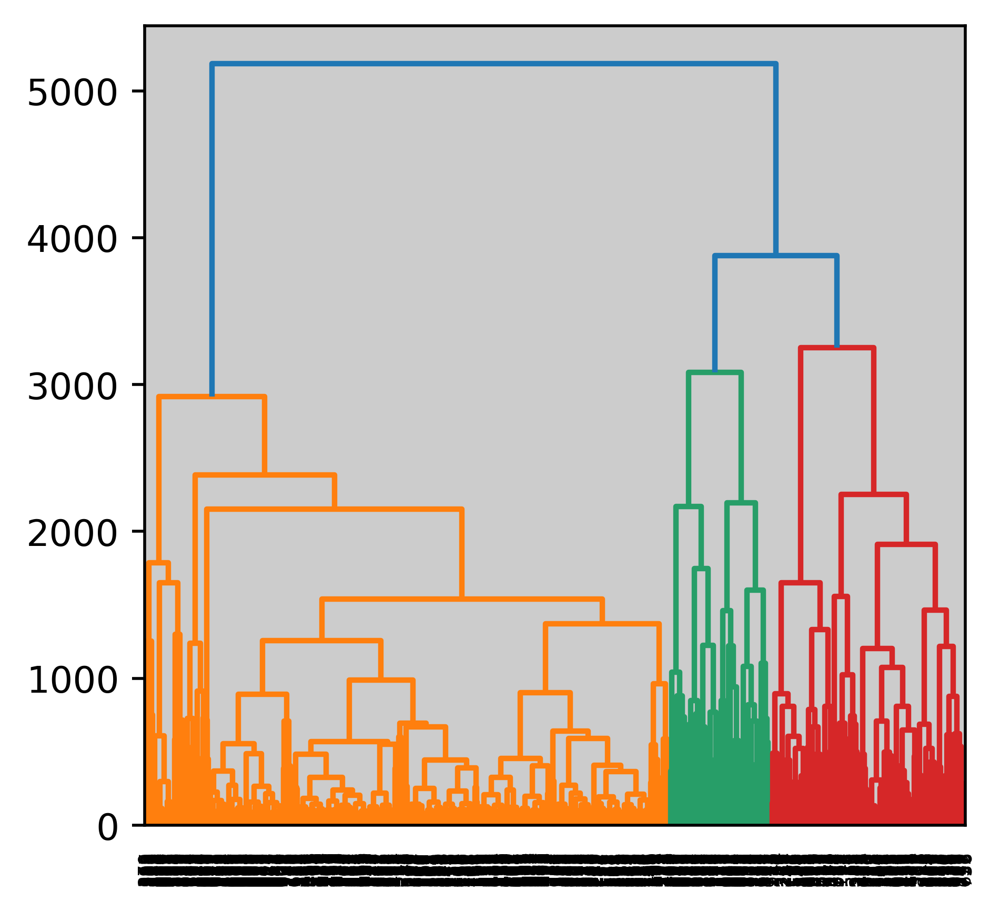

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 920 × 97
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=300, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[108 108 190 157  56 193 216  56  59  59  67 249 219 247  59 268  67 293
 260  65  65  52  52  95  95 134  52  48  95 159 134 241  52 299 208  17
  48  48 122 242  17 231 227 122 153 292 236 167 298 150 243 257 240  36
 281 117 117 283  26  36 263 194  25 282 210  79  79  79 202  18 172  62
   2   2  25 152 149 234  18  63  62  62   0  63 155   2   2 251  35  35
 165 286   0  35  35 170 230  42  42   0   0   0   0   0   0   0   0   0
   0   0   0  35 195 254 288  27 226  42   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  12
  12  12  27  42   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  12  12  12
  12  12  12   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   4
  10  24  26 214  12  12  12  12  12  14   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_68264/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

0      442
9       20
12      17
1       11
4        6
      ... 
162      1
163      1
164      1
165      1
299      1
Name: SMC_clusters, Length: 300, dtype: int64

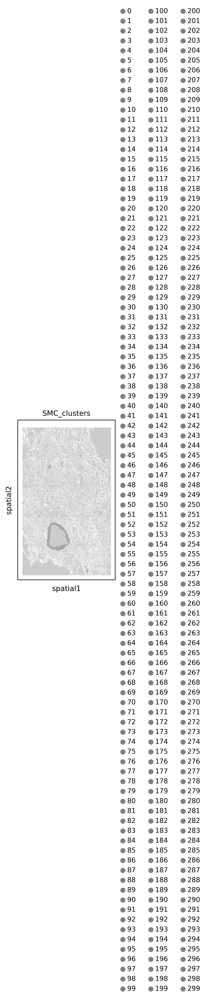

In [17]:
sc.pl.spatial(adata_aec, color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

In [18]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[0, 9, 12, 1, 4]

In [19]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [20]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [21]:
adata_aec_subset

AnnData object with n_obs × n_vars = 496 × 97
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [22]:
del adata_aec_subset.uns['SMC_clusters_colors']

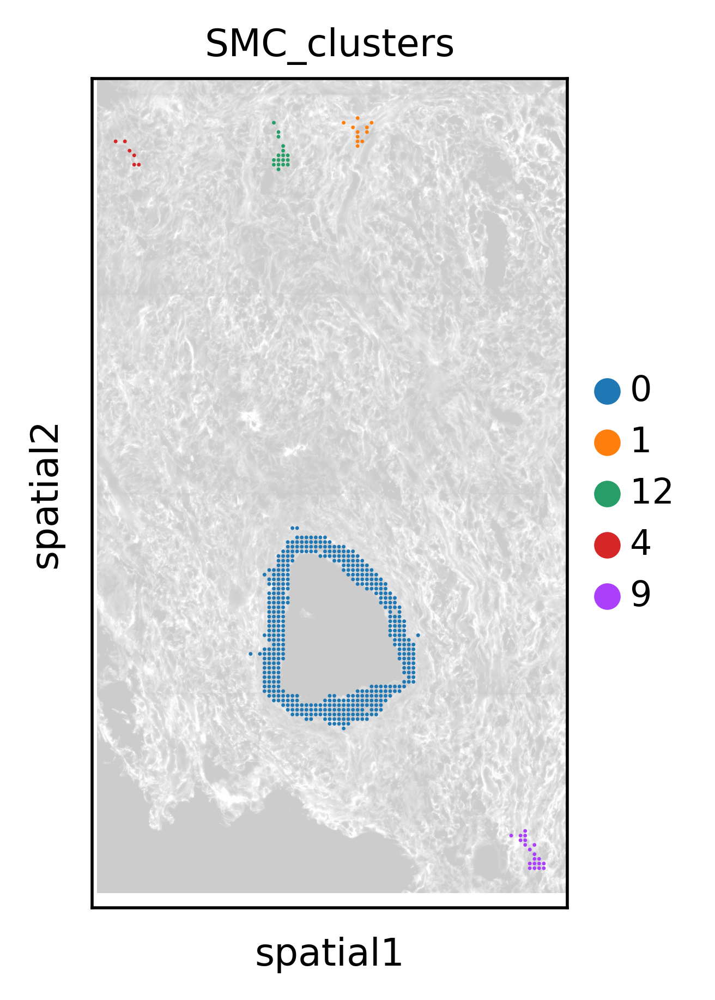

In [23]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

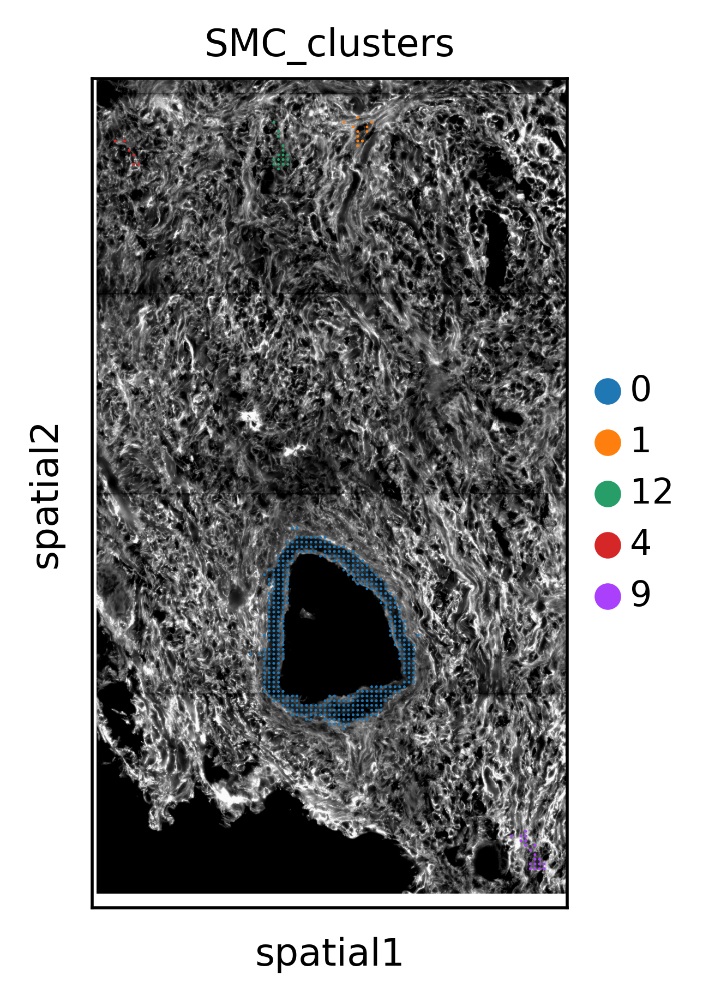

In [24]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

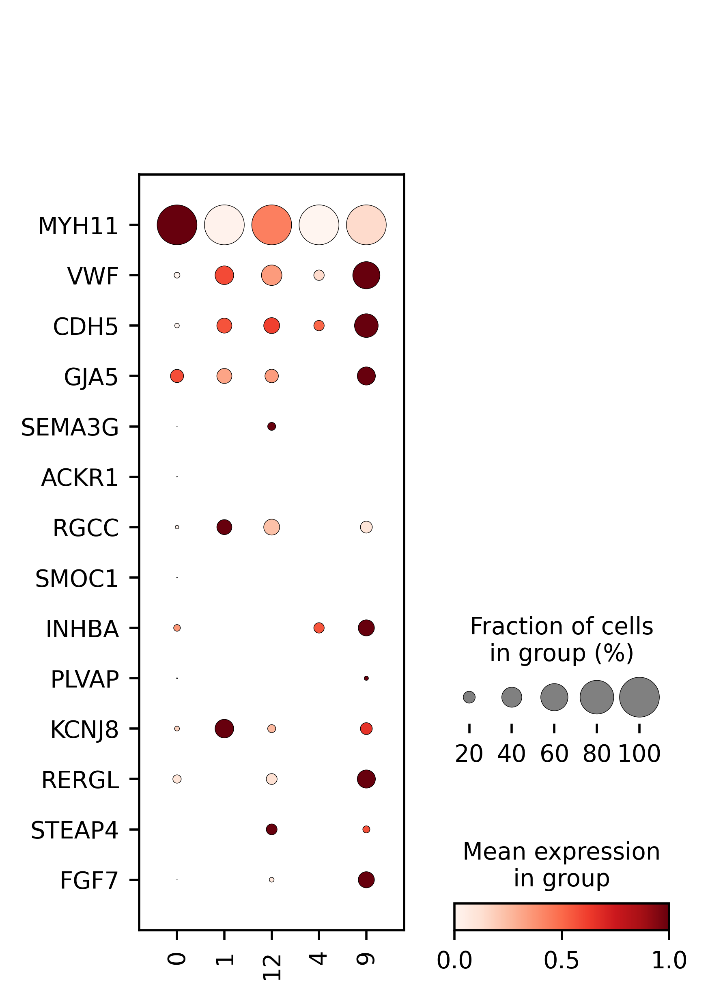

In [25]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [26]:
# add gene percentage expressed to dataframe

In [27]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [28]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [29]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [30]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [31]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [32]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [33]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [34]:
adata_aec_subset

AnnData object with n_obs × n_vars = 496 × 97
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [35]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [36]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0


In [37]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [38]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [39]:
matrix2 = matrix.replace(0, np.NaN)

In [40]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [41]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0
1,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN
12,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN


### add expression values to dataframe

In [42]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [43]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN


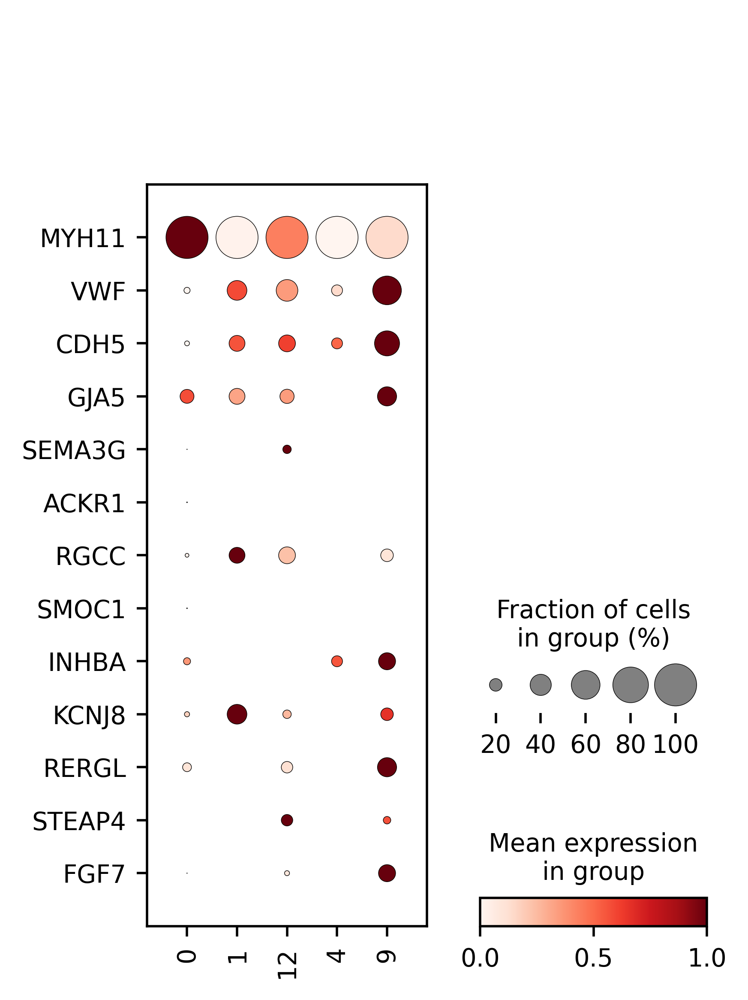

In [44]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [45]:
#add vessel type annotation column

In [46]:
test["Vessel"] = ['Artery','Capillary','Artery','Unclear','Artery']

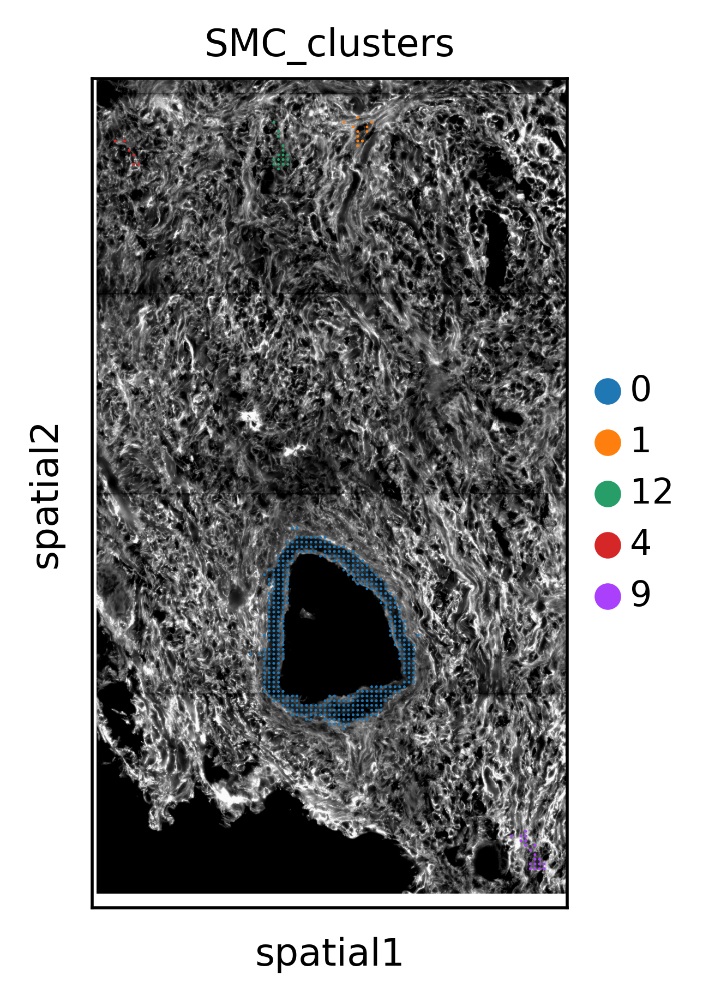

In [47]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

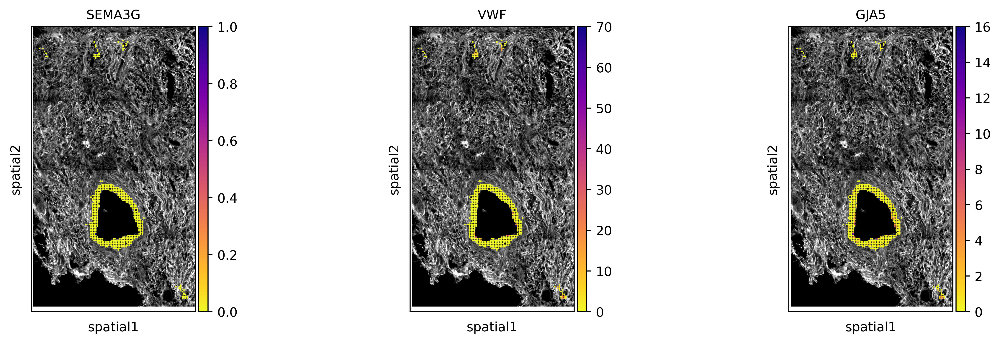

In [48]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5"],img_key='WGA',size=10, cmap = 'plasma_r')

In [49]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Artery
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery


### add vessel size numbers

In [50]:
adata_aec_subset.obs.SMC_clusters.value_counts()

0     442
9      20
12     17
1      11
4       6
Name: SMC_clusters, dtype: int64

In [51]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [52]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [53]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Artery,442
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary,11
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery,17
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery,20


In [54]:
group=pd.Series("Large", index=test2.index)

In [55]:
group[test2["size"] <= 30] = "Small"

In [56]:
group

SMC_clusters
0     Large
1     Small
12    Small
4     Small
9     Small
dtype: object

In [57]:
test2["group"] = group

In [58]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Artery,442,Large
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary,11,Small
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery,17,Small
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery,20,Small


In [59]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [60]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Artery,442,Large,Artery_Large
1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary,11,Small,Capillary_Small
12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery,17,Small,Artery_Small
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small
9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery,20,Small,Artery_Small


In [61]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [62]:
test2.index = ['ROI_B1-2_' + str(i) for i in test2.index.tolist()]

In [63]:
test2["ROI"] = "B1-2"

In [64]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_B1-2_0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Artery,442,Large,Artery_Large,B1-2
ROI_B1-2_1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary,11,Small,Capillary_Small,B1-2
ROI_B1-2_12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery,17,Small,Artery_Small,B1-2
ROI_B1-2_4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small,B1-2
ROI_B1-2_9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery,20,Small,Artery_Small,B1-2


[Text(0.5, 1.0, 'RERGL percentage expression')]

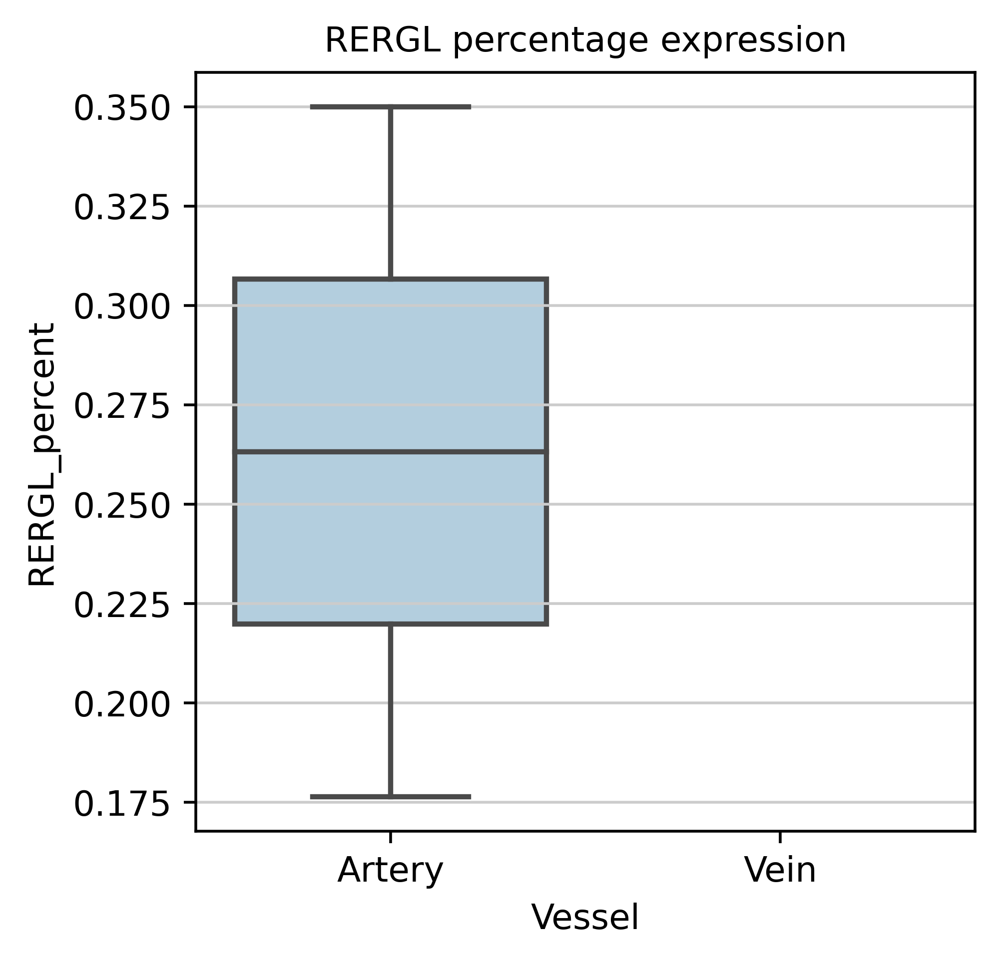

In [109]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

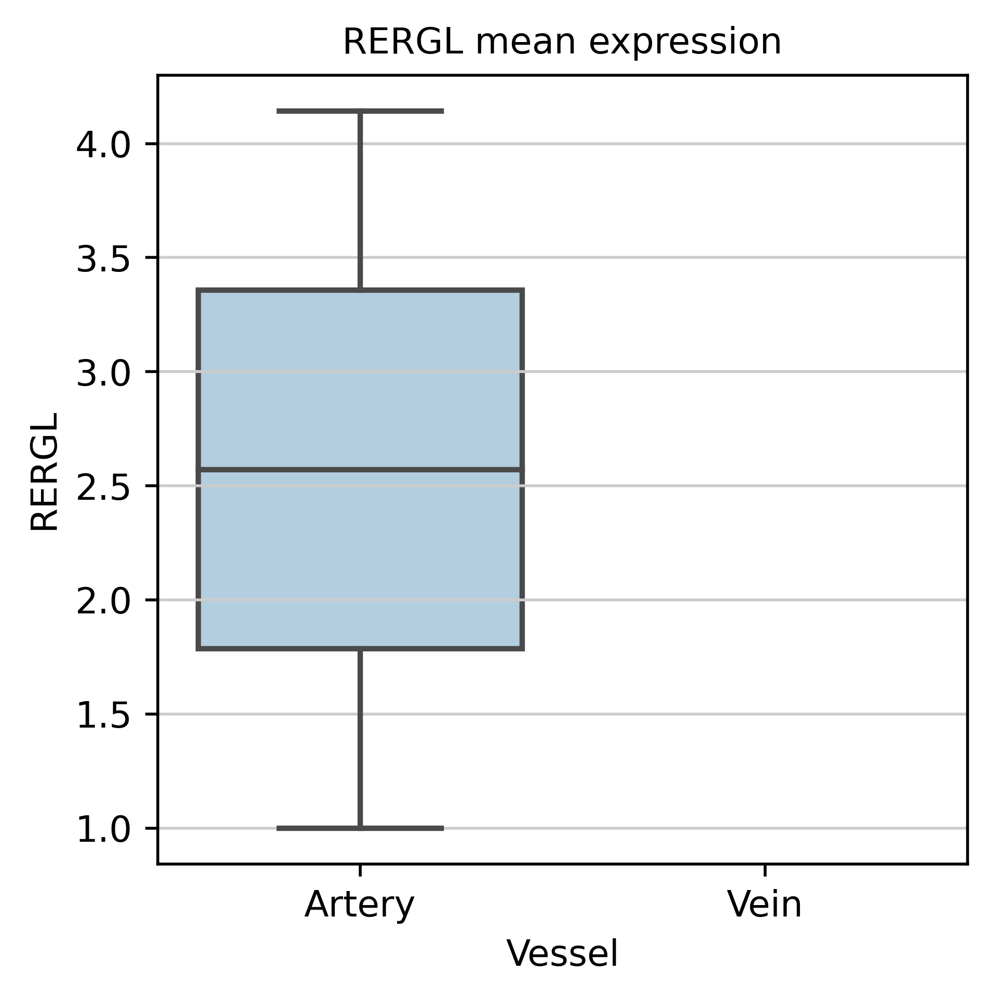

In [110]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

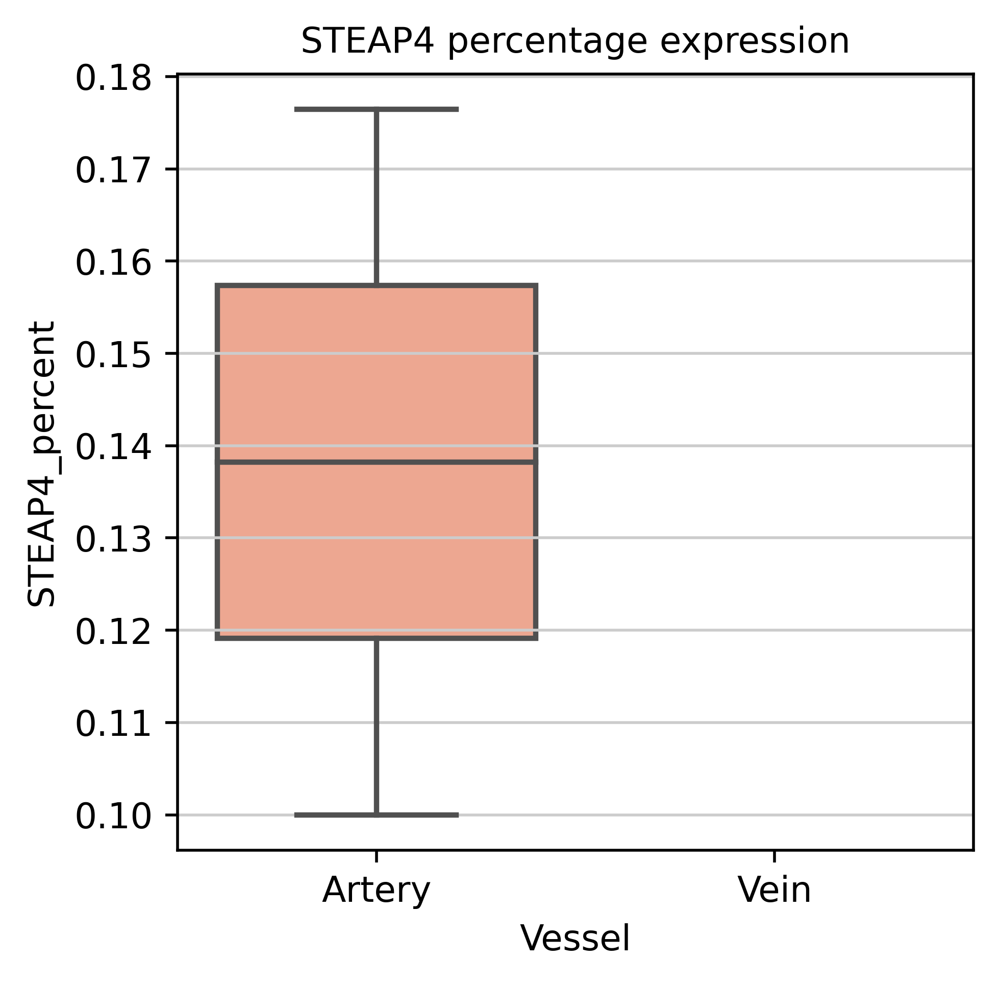

In [111]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

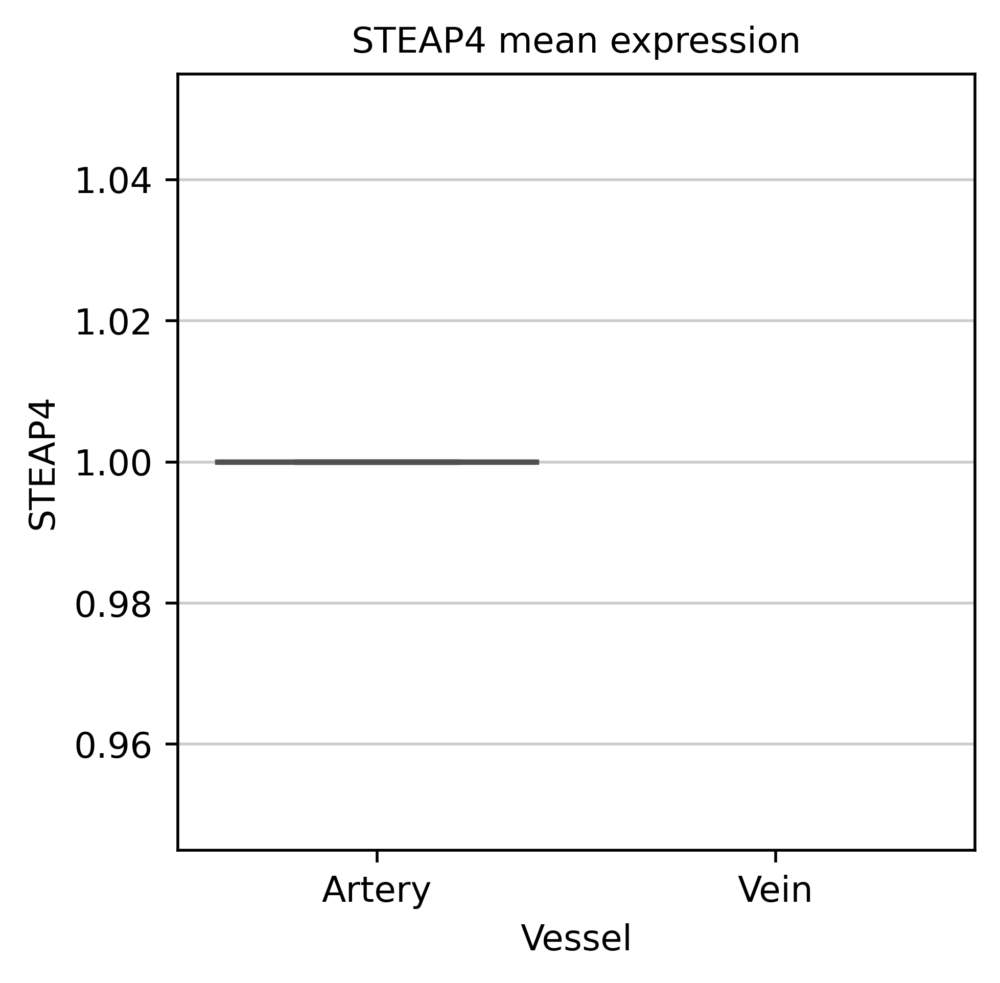

In [112]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

In [113]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_B1-2_0,0.124434,0.000000,0.002262,0.061086,0.377828,0.0,0.0,1.181818,NaN,2.0,2.718563,1.296296,1.0,1.0,1.222222,1.0,Unclear,B1-2
ROI_B1-2_1,0.000000,0.000000,0.000000,0.363636,0.545455,0.0,0.0,NaN,NaN,NaN,6.333333,1.250000,NaN,NaN,9.333333,NaN,Capillary,B1-2
ROI_B1-2_12,0.176471,0.176471,0.058824,0.117647,0.411765,0.0,0.0,1.000000,1.0,1.0,4.428571,1.000000,1.0,NaN,2.000000,NaN,Artery,B1-2
ROI_B1-2_4,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unclear,B1-2
ROI_B1-2_9,0.350000,0.100000,0.300000,0.200000,0.650000,0.0,0.0,4.142857,1.0,2.5,3.538461,1.500000,NaN,NaN,1.250000,NaN,Artery,B1-2
